---
## **Encoding faces**
---

In [ ]:
!pip install face_recognition

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 9.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566173 sha256=9fb089516817a53b2386c7a39f7b567d4d8f3613b740676dff6585397a89aa29
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models


In [ ]:
import face_recognition as fr

In [ ]:
import os
import cv2 as cv
import numpy as np
from IPython.display import clear_output as cls
from tqdm import tqdm
from glob import glob
import plotly.express as px
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

In [ ]:
# Setting a random
np.random.seed(42)

# Define the image dimensions
IMG_W, IMG_H, IMG_C = (160, 160, 3)

In [ ]:
# Specify the root directory path
root_path = '/kaggle/input/pins-face-recognition/105_classes_pins_dataset/'

# Collect all the person names
dir_names = os.listdir(root_path)
person_names = [name.split("_")[-1].title() for name in dir_names]
n_individuals = len(person_names)

print(f"Total number of individuals: {n_individuals}\n")
print(f"Name of the individuals : \n\t{person_names}")

Total number of individuals: 105

Name of the individuals : 
	['Alex Lawther', 'Logan Lerman', 'Maria Pedraza', 'Anthony Mackie', 'Bobby Morley', 'Chris Evans', 'Chris Pratt', 'Mark Zuckerberg', 'Anne Hathaway', 'Emilia Clarke', 'Cristiano Ronaldo', 'Josh Radnor', 'Henry Cavil', 'Zoe Saldana', 'Ellen Page', 'Gwyneth Paltrow', 'Natalie Dormer', 'Barbara Palvin', 'Krysten Ritter', 'Elon Musk', 'Leonardo Dicaprio', 'Bill Gates', 'Elizabeth Olsen', 'Megan Fox', 'Taylor Swift', 'Tom Hiddleston', 'Jeremy Renner', 'Melissa Fumero', 'Robert Downey Jr', 'Amber Heard', 'Jake Mcdorman', 'Robert De Niro', 'Grant Gustin', 'Jennifer Lawrence', 'Eliza Taylor', 'Scarlett Johansson', 'Marie Avgeropoulos', 'Brenton Thwaites', 'Adriana Lima', 'Amanda Crew', 'Hugh Jackman', 'Katherine Langford', 'Camila Mendes', 'Selena Gomez', 'Avril Lavigne', 'Jeff Bezos', 'Jimmy Fallon', 'Christian Bale', 'Shakira Isabel Mebarak', 'Alvaro Morte', 'Lindsey Morgan', 'Zac Efron', 'Dominic Purcell', 'Barack Obama', 'Tom Ho

In [ ]:
# Number of images available per person
n_images_per_person = [len(os.listdir(root_path + name)) for name in dir_names]
n_images = sum(n_images_per_person)

# Show
print(f"Total Number of Images : {n_images}.")
# Plot the Distribution of number of images per person.
fig = px.bar(x=person_names, y=n_images_per_person, color=person_names)
fig.update_layout({'title':{'text':"Distribution of number of images per person"}})
fig.show()

Total Number of Images : 17534.


In [ ]:
# Select all the file paths : 50 images per person.
filepaths = [path  for name in dir_names for path in glob(root_path + name + '/*')[:50]]
np.random.shuffle(filepaths)
print(f"Total number of images to be loaded : {len(filepaths)}")

# Create space for the images
all_images = np.empty(shape=(len(filepaths), IMG_W, IMG_H, IMG_C), dtype = np.float32)
all_labels = np.empty(shape=(len(filepaths), 1), dtype = np.int32)

# For each path, load the image and apply some preprocessing.
for index, path in tqdm(enumerate(filepaths), desc="Loading Data"):

    # Extract label
    label = [name[5:] for name in dir_names if name in path][0]
    label = person_names.index(label.title())

    # Load the Image
    image = plt.imread(path)

    # Resize the image
    image = cv.resize(image, dsize = (IMG_W, IMG_H))

    # Convert image stype
    image = image.astype(np.float32)/255.0

    # Store the image and the label
    all_images[index] = image
    all_labels[index] = label

In [ ]:
def show_data(
    images: np.ndarray,
    labels: np.ndarray,
    GRID: tuple=(15,6),
    FIGSIZE: tuple=(25,50),
    recog_fn = None,
    database = None
) -> None:

    # Plotting Configuration
    plt.figure(figsize=FIGSIZE)
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols

    # loop over the images and labels
    for index in range(n_images):

        # Select image in the corresponding label randomly
        image_index = np.random.randint(len(images))
        image, label = images[image_index], person_names[int(labels[image_index])]

        # Create a Subplot
        plt.subplot(n_rows, n_cols, index+1)

        # Plot Image
        plt.imshow(image)
        plt.axis('off')

        if recog_fn is None:
            # Plot title
            plt.title(label)
        else:
            recognized = recog_fn(image, database)
            plt.title(f"True:{label}\nPred:{recognized}")

    # Show final Plot
    plt.tight_layout()
    plt.show()

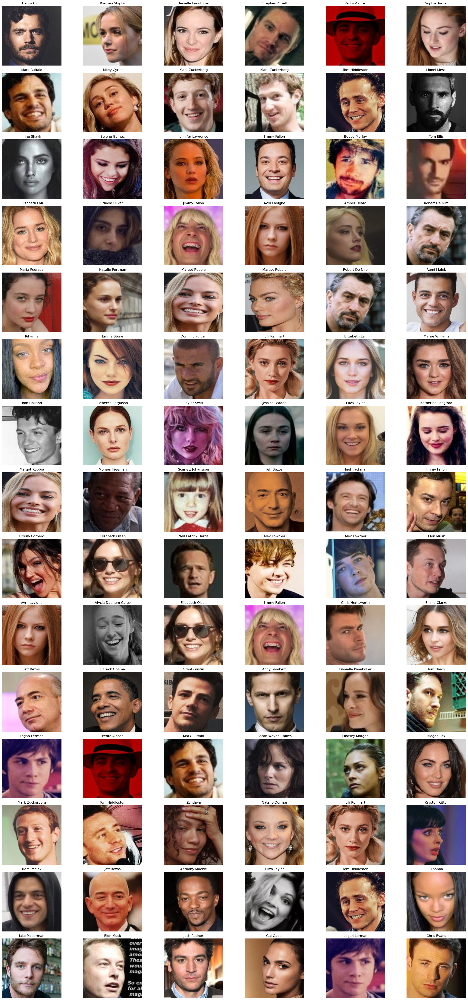

In [ ]:
show_data(images = all_images, labels = all_labels)

In [ ]:
from torchvision import datasets
import pandas as pd
dataset = datasets.ImageFolder('/kaggle/input/pins-face-recognition/105_classes_pins_dataset')
num_classes = len(dataset.classes)
encodings_list = []
label_list = []

with tqdm(total=len(dataset)) as pbar:
    for image, label in dataset:
        image = np.array(image)
        face_loc = (0, image.shape[1], image.shape[0], 0)
        # boxes = face_locations(image, model="cnn")
        # compute the facial embedding for the face
        encodings = fr.face_encodings(image, [face_loc])
        # encodings =
        if len(encodings) > 0:
            encodings_list.append(encodings[0].tolist())
            label_list.append(label)
        pbar.update(1)

df = pd.DataFrame(encodings_list)
df['target'] = label_list
df.to_csv('face_encodings.csv', index=False)

**OR**

In [ ]:
# Load model
model = load_model('/kaggle/input/facenet-keras/facenet_keras.h5')

def image_to_embedding(image: np.ndarray, model) -> np.ndarray:
    """Generate face embedding for image.

    Args:
        image (np.ndarray): Image to generate encoding for.
        model : Pretrained face recognition model.

    Returns:
        np.ndarray: Face embedding for image.
    """

    # Obtain image encoding
    embedding = model.predict(image[np.newaxis,...])

    # Normalize bedding using L2 norm.
    embedding /= np.linalg.norm(embedding, ord=2)

    # Return embedding
    return embedding


In [ ]:
from torchvision import datasets
dataset = datasets.ImageFolder('/kaggle/input/pins-face-recognition/105_classes_pins_dataset')
num_classes = len(dataset.classes)
encodings_list = []
label_list = []

with tqdm(total=len(dataset)) as pbar:
    for image, label in dataset:
        image=np.array(image)
        image = cv.resize(image, dsize=(IMG_W, IMG_H))
        image = image.astype(np.float32) / 255.0
        # computing the facial embedding for the face
        encodings = image_to_embedding(image, model)

        # boxes = face_locations(image, model="cnn")
        # compute the facial embedding for the face

        # encodings =
        if len(encodings) > 0:
            encodings_list.append(encodings[0].tolist())
            label_list.append(label)
        pbar.update(1)

df = pd.DataFrame(encodings_list)
df['target'] = label_list
df.to_csv('face_encodings_face_rec.csv', index=False)